# Jul 12th, 2022 (perc = 15 is better)

**Motivation**:  <br>

In [1]:
# HIDE CODE


import os
import sys
from pprint import pprint
from copy import deepcopy as dc
from os.path import join as pjoin
from scipy.ndimage import gaussian_filter
from IPython.display import display, IFrame, HTML

# tmp & extras dir
git_dir = pjoin(os.environ['HOME'], 'Dropbox/git')
extras_dir = pjoin(git_dir, 'jb-Ca-fMRI/_extras')
fig_base_dir = pjoin(git_dir, 'jb-Ca-fMRI/figs')
tmp_dir = pjoin(git_dir, 'jb-Ca-fMRI/tmp')

# GitHub
sys.path.insert(0, pjoin(git_dir, '_Ca-fMRI'))
from figures.fighelper import *
from analysis.final import *
from utils.render import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from tqdm.notebook import tqdm
%matplotlib inline
set_style()

## Prepare (512)

In [2]:
nn = 512
perc = 15
mice = Mice(nn)
pal = prepare_palette()

## K = 20

In [3]:
num_k = 20
bt_dict, props_bo, props_ca = default_props(mice, num_k, perc)
bt = BootStrap(**props_ca)

### OCs

In [4]:
%%time

results = similiarity_results(mice, num_k, perc, None, int(1e2))
list(results)

CPU times: user 23.8 s, sys: 36.8 s, total: 1min
Wall time: 3min 21s


[
    'bt_dict',
    'props_bo',
    'props_ca',
    'pi_sorted',
    'sim',
    'sim_b',
    'sim_overall',
    'sim_overall_b',
    'good_runs',
    'data4perm',
    'tests'
]

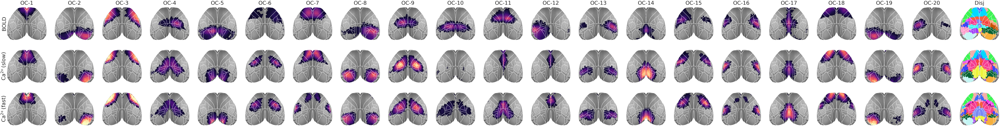

In [5]:
_ = bt.show(results['pi_sorted'], **show_kws(num_k))

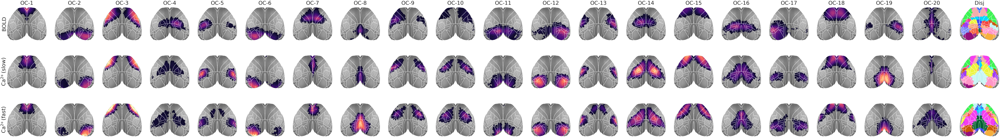

## K = 21

In [6]:
num_k = 21
bt_dict, props_bo, props_ca = default_props(mice, num_k, perc)
bt = BootStrap(**props_ca)

### OCs

In [7]:
%%time

results = similiarity_results(mice, num_k, perc, None, int(1e2))
list(results)

CPU times: user 25.3 s, sys: 52.1 s, total: 1min 17s
Wall time: 2min 40s


[
    'bt_dict',
    'props_bo',
    'props_ca',
    'pi_sorted',
    'sim',
    'sim_b',
    'sim_overall',
    'sim_overall_b',
    'good_runs',
    'data4perm',
    'tests'
]

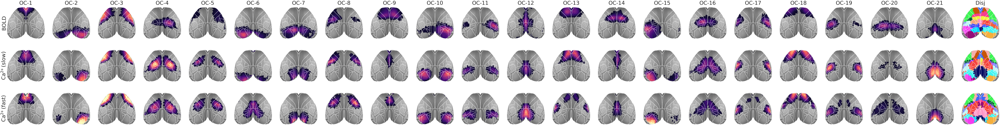

In [8]:
_ = bt.show(results['pi_sorted'], **show_kws(num_k))

## K = 7

In [9]:
num_k = 7
bt_dict, props_bo, props_ca = default_props(mice, num_k, perc)
bt = BootStrap(**props_ca)

### OCs

In [10]:
%%time

results = similiarity_results(
    mice=mice,
    perc=perc,
    num_k=num_k,
    merge_thres=0.444,
    n_resamples=int(1e2),
)

CPU times: user 16.2 s, sys: 13.1 s, total: 29.3 s
Wall time: 1min 13s


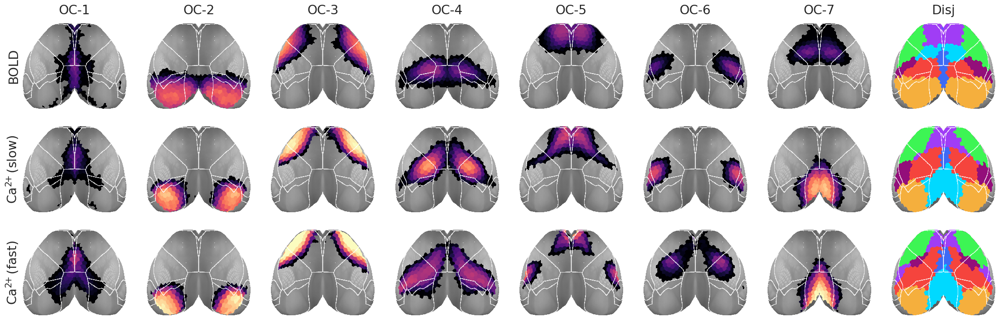

In [11]:
_ = bt.show(results['pi_sorted'], **show_kws(num_k))

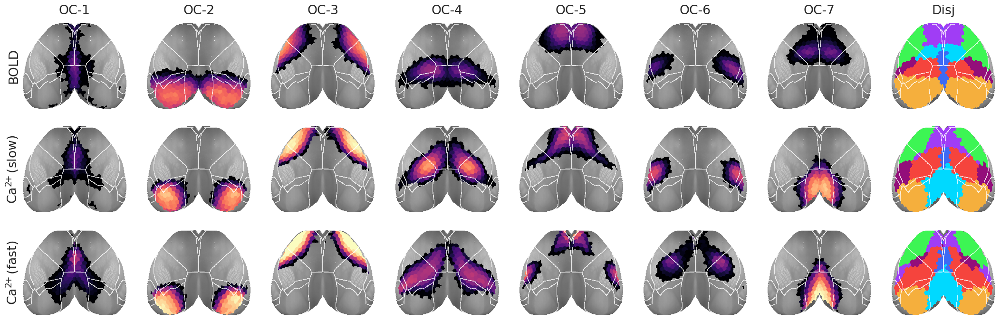

### Find best thres.

In [7]:
num_k = 7
bt_dict, props_bo, props_ca = default_props(mice, num_k, perc, mg=True)
bt = BootStrap(**props_ca)
bt_dict[BOLD].run_pi.shape

(10, 3, 4, 500, 8, 542)

#### Find best threshold (but remove pi <= 1 / num_k)

In [8]:
%%time

dlist = []
for thres in np.linspace(0.3, 0.5, 101):
    pi, *_ = bt_dict[BOLD].merge_vis(thres, bt_dict[BOLD].run_pi)
    pi = avg(pi)
    pi[pi < 1 / num_k] = 0
    ovp, disj = bt.symmetry_score(pi, decimals=10)
    for lbl, s in {'ovp': ovp, 'disj': disj}.items():
        dlist.append({
            'thres': [thres] * len(s),
            'label': [lbl] * len(s),
            'score': s.values(),
            'oc_idx': s.keys(),
        })
df = pd.DataFrame(merge_dicts(dlist))

CPU times: user 9min 13s, sys: 7min 58s, total: 17min 12s
Wall time: 17min 53s


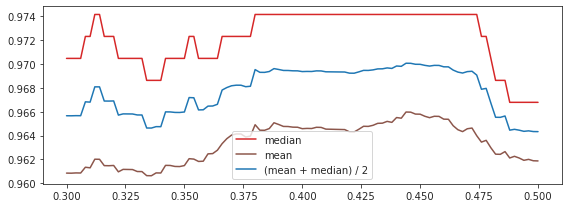

In [9]:
df_mean = df.loc[df['oc_idx'] != -1].groupby(['thres']).mean().drop(columns='oc_idx').reset_index()
df_median = df.loc[df['oc_idx'] != -1].groupby(['thres']).median().drop(columns='oc_idx').reset_index()

fig, ax = create_figure(1, 1, (8, 3))
ax.plot(df_median['thres'], df_median['score'], color='C3', label='median')
ax.plot(df_mean['thres'], df_mean['score'], color='C5', label='mean')

df_mean['score'] = (df_mean['score'] + df_median['score']) / 2
ax.plot(df_mean['thres'], df_mean['score'], color='C0', label='(mean + median) / 2')
ax.legend()
plt.show()

In [10]:
i = df_mean['score'].argmax()
df_mean.iloc[[i]]

,thres,score
72,0.444,0.970072


In [11]:
thres = df_mean.iloc[i]['thres']
thres

0.444

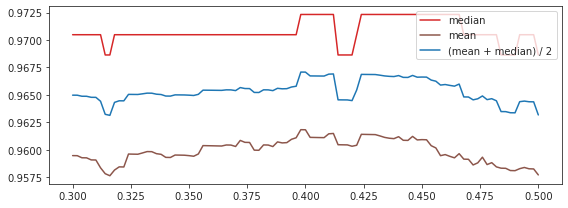

,thres,score
49,0.398,0.967076


0.398

#### Find best threshold

In [12]:
%%time

dlist = []
for thres in np.linspace(0.3, 0.5, 101):
    pi, *_ = bt_dict[BOLD].merge_vis(thres, bt_dict[BOLD].run_pi)
    ovp, disj = bt.symmetry_score(avg(pi), decimals=10)
    for lbl, s in {'ovp': ovp, 'disj': disj}.items():
        dlist.append({
            'thres': [thres] * len(s),
            'label': [lbl] * len(s),
            'score': s.values(),
            'oc_idx': s.keys(),
        })
df = pd.DataFrame(merge_dicts(dlist))

CPU times: user 9min 22s, sys: 1min 46s, total: 11min 8s
Wall time: 11min 8s


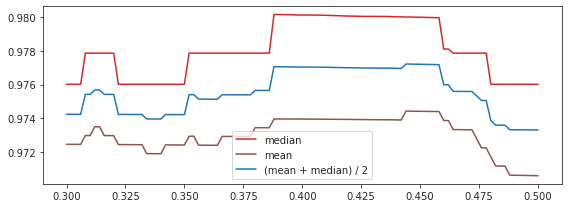

In [13]:
df_mean = df.loc[df['oc_idx'] != -1].groupby(['thres']).mean().drop(columns='oc_idx').reset_index()
df_median = df.loc[df['oc_idx'] != -1].groupby(['thres']).median().drop(columns='oc_idx').reset_index()

fig, ax = create_figure(1, 1, (8, 3))
ax.plot(df_median['thres'], df_median['score'], color='C3', label='median')
ax.plot(df_mean['thres'], df_mean['score'], color='C5', label='mean')

df_mean['score'] = (df_mean['score'] + df_median['score']) / 2
ax.plot(df_mean['thres'], df_mean['score'], color='C0', label='(mean + median) / 2')
ax.legend()
plt.show()

In [14]:
i = df_mean['score'].argmax()
df_mean.iloc[[i]]

,thres,score
72,0.444,0.977212


In [15]:
thres = df_mean.iloc[i]['thres']
thres

0.444

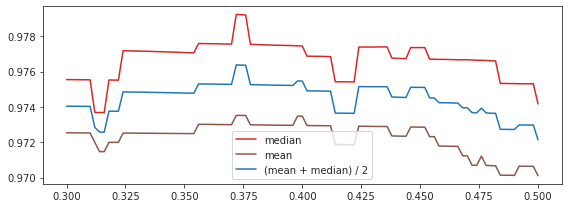

,thres,score
36,0.372,0.976379


0.372

#### Decide which threshold is to be used

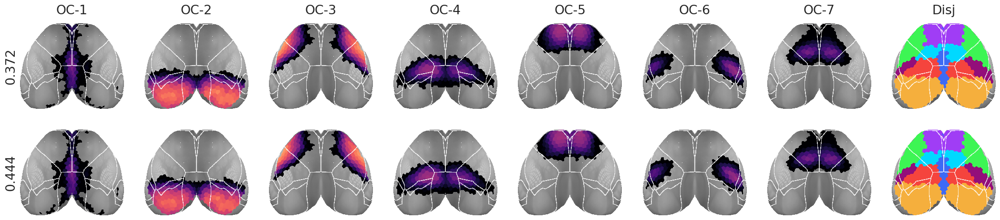

In [17]:
_ = bt.show(
    data={
        th: avg(bt_dict[BOLD].merge_vis(th, bt_dict[BOLD].run_pi)[0])
        for th in [0.372, 0.444]},
    **show_kws(num_k),
)

#### It has been decided: 0.444

In [18]:
thres

0.444

In [19]:
o = bt_dict[BOLD]
o.run_pi, *_ = o.merge_vis(thres, o.run_pi)
o.pi_prune, *_ = o.merge_vis(thres, o.pi_prune)
o.num_k -= 1

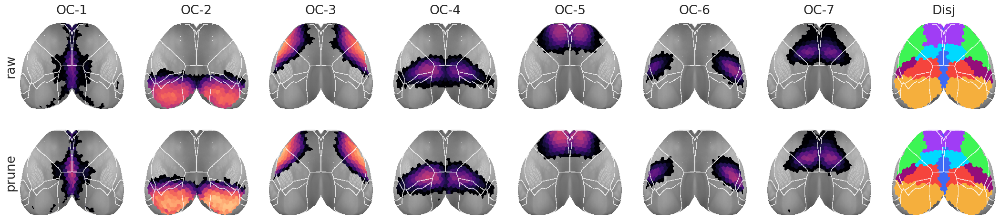

In [20]:
_ = bt.show(data={'raw': avg(o.run_pi), 'prune': avg(o.pi_prune)}, **show_kws(num_k))

### OCs, with thres = 0.444

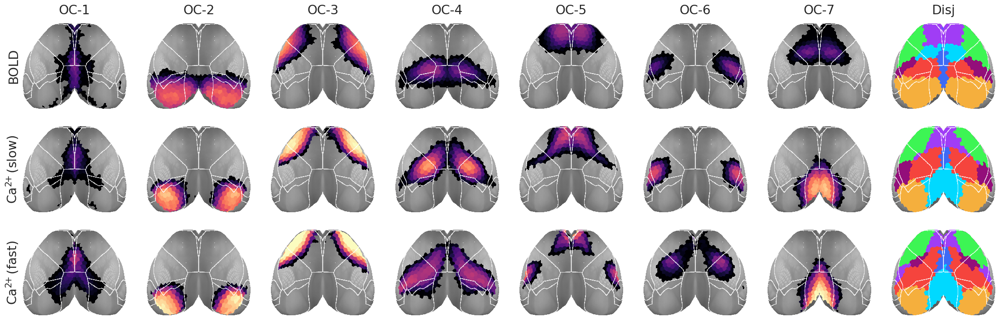

CPU times: user 32.2 s, sys: 8min 44s, total: 9min 17s
Wall time: 9min 54s


In [23]:
%%time

results = similiarity_results(
    mice=mice,
    perc=perc,
    num_k=num_k,
    merge_thres=0.444,
    n_resamples=int(1e2),
)
_ = bt.show(results['pi_sorted'], **show_kws(num_k))

### Find best num seeds

In [24]:
%%time

dlist = []
for mode, o in results['bt_dict'].items():
    n_seeds = o.run_pi.shape[-3]
    for i in range(0, n_seeds):
        pi = o._get_pi_seed_idx(i, use_prune=False)
        pi = avg(pi)
        
        ovp, disj = o.symmetry_score(pi, decimals=10)
        for lbl, s in {'ovp': ovp, 'disj': disj}.items():
            dlist.append({
                'mode': [mode] * len(s),
                'label': [lbl] * len(s),
                'tag': ['full'] * len(s),
                'seed': [i] * len(s),
                'score': s.values(),
                'oc_idx': s.keys(),
            })

        pi[pi < 1 / num_k] = 0
        ovp, disj = o.symmetry_score(pi, decimals=10)
        for lbl, s in {'ovp': ovp, 'disj': disj}.items():
            dlist.append({
                'mode': [mode] * len(s),
                'label': [lbl] * len(s),
                'tag': ['zeroed'] * len(s),
                'seed': [i] * len(s),
                'score': s.values(),
                'oc_idx': s.keys(),
            })

df = pd.DataFrame(merge_dicts(dlist))
df = df.loc[df['oc_idx'] != -1]

CPU times: user 13min 43s, sys: 3min 35s, total: 17min 18s
Wall time: 17min 18s


In [25]:
df_mean = df.groupby(['seed', 'mode', 'tag']).mean().drop(columns=['oc_idx']).reset_index()
df_median = df.groupby(['seed', 'mode', 'tag']).median().drop(columns=['oc_idx']).reset_index()

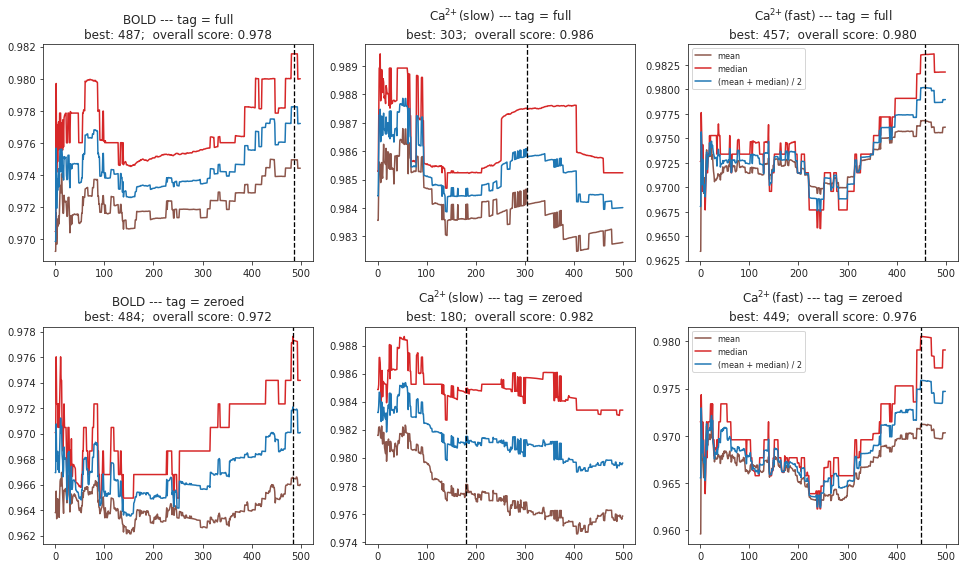

In [26]:
best_num_seeds = {}

fig, axes = create_figure(2, len(bt_dict), (13.5, 8))
for j, tag in enumerate(df['tag'].unique()):
    for i, (mode, o) in enumerate(bt_dict.items()):
        ax = axes[j, i]
        _df_mean = df_mean.loc[
            (df_mean['mode'] == mode) &
            (df_mean['tag'] == tag)

        ]
        _df_median = df_median.loc[
            (df_median['mode'] == mode) &
            (df_median['tag'] == tag)
        ]

        ax.plot(_df_mean['seed'], _df_mean['score'], color='C5', label='mean')
        ax.plot(_df_median['seed'], _df_median['score'], color='C3', label='median')

        overall = (_df_mean['score'] + _df_median['score']) / 2
        ax.plot(_df_mean['seed'], overall, color='C0', label='(mean + median) / 2')

        delta = o.run_pi.shape[-3] // 3
        idx = overall[delta:].argmax()
        idx += delta
        best_seed_i = _df_mean.iloc[idx]['seed']
        best_num_seeds[mode] = best_seed_i

        ax.axvline(best_seed_i, color='k', ls='--', lw=1.3)

        ax.set_title(f"{mode} --- tag = {tag}\nbest: {best_seed_i};  overall score: {overall.iloc[idx]:0.3f}")
        if i == 2:
            ax.legend(fontsize=8)

plt.show()

In [27]:
best_num_seeds

{'BOLD': 484, 'Ca$^{2\\!\\!+}$(slow)': 180, 'Ca$^{2\\!\\!+}$(fast)': 449}

## Sort

### First, using best seeds

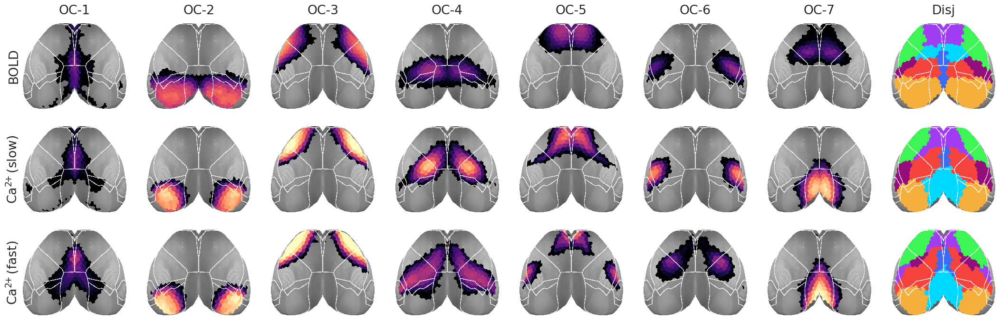

In [29]:
pi_dict = {
    mode: avg(o._get_pi_seed_idx(best_num_seeds[mode], use_prune=False))
    for mode, o in bt_dict.items()
}
pi_sorted, gmaps = sort_communities(pi_dict)
_ = bt.show(pi_sorted, **show_kws(num_k))

### Final: using all seeds

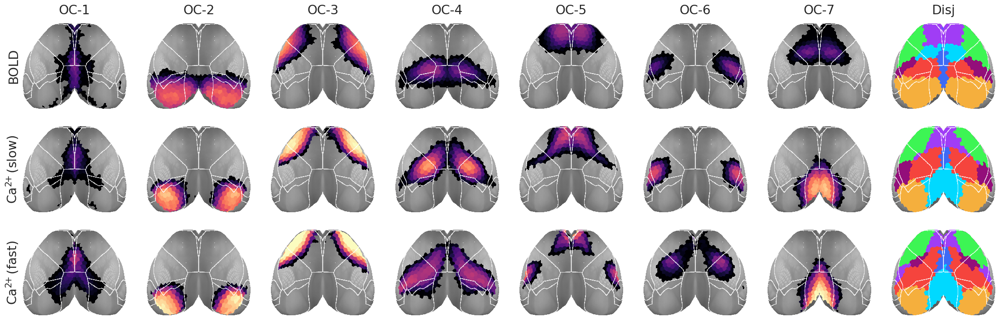

In [30]:
pi_dict = {
    mode: avg(o.run_pi) for
    mode, o in bt_dict.items()
}
pi_sorted, gmaps = sort_communities(pi_dict)
_ = bt.show(pi_sorted, **show_kws(num_k))

### Conclusions:

- Use 0.444 threshold for bold mg
- Use all seeds for avg